# CESM circulation analysis

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import xesmf as xe
import nc_time_axis
import cftime 
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import matplotlib.colors as mcolors
import matplotlib as mpl

## Bring in dask resources for plotting

In [2]:
# Import dask
import dask

# Use dask jobqueue
from dask_jobqueue import PBSCluster

# Import a client
from dask.distributed import Client

# Setup your PBSCluster
nmem1 = '4GiB' # PBSCluster specification
nmem2 = '4GB' # pbs specification
cluster = PBSCluster(
    cores=1, # The number of cores you want
    memory=nmem1, # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='/glade/derecho/scratch/kdagon/dask-local', # Use your local directory
    resource_spec='select=1:ncpus=1:mem='+nmem2, # Specify resources
    account='P06010014', # Input your project ID here
    walltime='03:00:00', # Amount of wall time
    interface='ext', # Interface to use
)

# Scale up -- how to determine this number?
cluster.scale(10)

# Setup your client
client = Client(cluster)

/glade/work/kdagon/conda-envs/PEx_v2/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42095 instead
  warnings.warn(


In [3]:
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/42095/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/42095/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.95:41969,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/42095/status,Total threads: 0
Started: Just now,Total memory: 0 B


## Filepaths
From DLFront analysis

In [4]:
cesm_hist_filepath = "/glade/campaign/cgd/ccr/kdagon/dlfront/B20TRC5CN/" # need to be on casper, CESM historical output
cesm_rcp26_filepath = "/glade/campaign/cgd/ccr/kdagon/dlfront/BRCP26C5CN/" # RCP2.6 output
cesm_rcp85_filepath = "/glade/campaign/cgd/ccr/kdagon/dlfront/BRCP85C5CN/" # RCP8.5 output

From CGNet analysis

In [5]:
cgnet_hist_filepath = "/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/" # need to be on casper, CESM historical output
cgnet_rcp26_filepath = "/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/" # RCP2.6 output
cgnet_rcp85_filepath = "/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/" # RCP8.5 output

## Set regional bounds

In [6]:
# Western US domain from Payne & Magnusdottir (2014,2015) papers (estimated, modified to include land at all lons)
#lat_bounds = slice(25,61)
#lon_bounds = slice(189, 250)

# Restricted western US (mostly land) domain from Collow et al. 2020
#lat_bounds = slice(32,50)
#lon_bounds = slice(235,246)

# Western US/Eastern Pacific domain from ARTMIP
#lat_bounds = slice(25,65)
#lon_bounds = slice(180,250)

# Extended North American / Eastern Pacific domain
lat_bounds = slice(10,77)
lon_bounds = slice(120,260)

## Zonal wind field files

In [49]:
# h0.U300 is monthly mean 300mb zonal wind
# remapped from unstructured grid to FV

U300_B20TRC5CN_files = "b.e13.B20TRC5CN.ne120_g16.003.cam.h0.U300.200001-200512.regrid_0.23x0.31.nc"
U300_BRCP26C5CN_files = "b.e13.BRCP26C5CN.ne120_g16.003.cam.h0.U300.200601-201512.regrid_0.23x0.31.nc"
U300_BRCP85C5CN_files = "*h0.U300*regrid*.nc"

In [50]:
U300_hist_files = [cesm_hist_filepath+U300_B20TRC5CN_files, cesm_rcp26_filepath+U300_BRCP26C5CN_files] # combined hist/rcp26; need explicit filenames (not glob strings) if using a list
U300_rcp_files = cesm_rcp85_filepath+U300_BRCP85C5CN_files

In [51]:
U300_hist_files

['/glade/campaign/cgd/ccr/kdagon/dlfront/B20TRC5CN/b.e13.B20TRC5CN.ne120_g16.003.cam.h0.U300.200001-200512.regrid_0.23x0.31.nc',
 '/glade/campaign/cgd/ccr/kdagon/dlfront/BRCP26C5CN/b.e13.BRCP26C5CN.ne120_g16.003.cam.h0.U300.200601-201512.regrid_0.23x0.31.nc']

### Preprocessing function for zonal wind

In [52]:
def preprocess_U300(ds):
    import cf_xarray # need to import within preprocessing function to access .cf attribute
    # fix CESM time bounds for monthly output
    attrs, encoding = ds.time.attrs.copy(), ds.time.encoding.copy()
    time_bounds = ds.cf.get_bounds('time')
    time_bounds_dim_name = ds.cf.get_bounds_dim_name('time')
    ds = ds.assign_coords(time=time_bounds.mean(time_bounds_dim_name))
    ds.time.attrs, ds.time.encoding = attrs, encoding
    # return regional domain
    return ds['U300'].sel(lat=lat_bounds,lon=lon_bounds)

### Read in U300 files with or without preprocessing function

In [53]:
%%time
#U300_hist = xr.open_mfdataset(U300_hist_files, concat_dim='time', combine="nested", chunks={'time':150}, parallel=True, preprocess=preprocess_U300) # unclear if chunking is needed for these monthly (smaller) files
U300_hist = xr.open_mfdataset(U300_hist_files, concat_dim='time', combine="nested", parallel=True, preprocess=preprocess_U300) 
#U300_hist_ds = xr.open_mfdataset(U300_hist_files, concat_dim='time', combine="nested", chunks={'time':150}, parallel=True)

CPU times: user 276 ms, sys: 40.5 ms, total: 316 ms
Wall time: 1.79 s


In [54]:
U300_hist
#U300_hist_ds

<xarray.DataArray 'U300' (time: 192, lat: 285, lon: 449)>
dask.array<concatenate, shape=(192, 285, 449), dtype=float32, chunksize=(120, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * time     (time) object 2000-01-16 12:00:00 ... 2015-12-16 12:00:00
Attributes:
    long_name:      Zonal wind at 300 mbar pressure surface
    units:          m/s
    plevo:          300.0
    cell_measures:  area: area

### Monthly time index correction
If not using preprocessing function

In [ ]:
attrs, encoding = U300_hist_ds.time.attrs.copy(), U300_hist_ds.time.encoding.copy()
time_bounds = U300_hist_ds.cf.get_bounds('time')#.load() # at one point needed to load time_bounds because .mean won't operate on a dask array (may have been fixed with update)
time_bounds_dim_name = U300_hist_ds.cf.get_bounds_dim_name('time')
U300_hist_ds = U300_hist_ds.assign_coords(time=time_bounds.mean(time_bounds_dim_name))
U300_hist_ds.time.attrs, U300_hist_ds.time.encoding = attrs, encoding
U300_hist = U300_hist_ds['U300'].sel(lat=lat_bounds,lon=lon_bounds)
U300_hist

### Subset historical to match number of RCP8.5 years (14)

In [55]:
#U300_hist.sel(time="2000-01") # this works
#U300_hist.sel(time="2014-12") # this works
U300_hist = U300_hist.sel(time=slice("2000-01", "2014-12")) # this works now with updated xarray
#U300_hist = U300_hist[:180] 
U300_hist

<xarray.DataArray 'U300' (time: 180, lat: 285, lon: 449)>
dask.array<getitem, shape=(180, 285, 449), dtype=float32, chunksize=(108, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * time     (time) object 2000-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    long_name:      Zonal wind at 300 mbar pressure surface
    units:          m/s
    plevo:          300.0
    cell_measures:  area: area

In [56]:
U300_rcp_files

'/glade/campaign/cgd/ccr/kdagon/dlfront/BRCP85C5CN/*h0.U300*regrid*.nc'

In [57]:
U300_rcp = xr.open_mfdataset(U300_rcp_files, concat_dim='time', combine="nested", parallel=True, preprocess=preprocess_U300)
U300_rcp
# without preprocess
#U300_rcp_ds = xr.open_mfdataset(U300_rcp_files, concat_dim='time', combine="nested", chunks={'time':150}, parallel=True)
#U300_rcp_ds

<xarray.DataArray 'U300' (time: 180, lat: 285, lon: 449)>
dask.array<concatenate, shape=(180, 285, 449), dtype=float32, chunksize=(12, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * time     (time) object 2086-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    long_name:      Zonal wind at 300 mbar pressure surface
    units:          m/s
    plevo:          300.0
    cell_measures:  area: area

In [ ]:
# without preprocess
attrs, encoding = U300_rcp_ds.time.attrs.copy(), U300_rcp_ds.time.encoding.copy()
time_bounds = U300_rcp_ds.cf.get_bounds('time')
time_bounds_dim_name = U300_rcp_ds.cf.get_bounds_dim_name('time')
U300_rcp_ds = U300_rcp_ds.assign_coords(time=time_bounds.mean(time_bounds_dim_name))
U300_rcp_ds.time.attrs, U300_rcp_ds.time.encoding = attrs, encoding
U300_rcp = U300_rcp_ds['U300'].sel(lat=lat_bounds,lon=lon_bounds)
U300_rcp

### Calculate seasonal means and (optionally) persist for plotting

#### Accounting for days in each month
See: https://docs.xarray.dev/en/stable/examples/monthly-means.html

In [58]:
hist_month_length = U300_hist.time.dt.days_in_month
hist_month_length

<xarray.DataArray 'days_in_month' (time: 180)>
array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
Coordinates:
  * time     (time) object 2000-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    axis:           T
    bounds:         time_bnds
    long_name:      time
    standard_name:  time

In [59]:
rcp_month_length = U300_rcp.time.dt.days_in_month
rcp_month_length

<xarray.DataArray 'days_in_month' (time: 180)>
array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
       31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30,
       31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
Coordinates:
  * time     (time) object 2086-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    bounds:     time_bnds
    long_name:  time

In [60]:
# Calculate the weights by grouping by 'time.season'.
hist_weights = (
    hist_month_length.groupby("time.season") / hist_month_length.groupby("time.season").sum()
)

# Test that the sum of the weights for each season is 1.0
np.testing.assert_allclose(hist_weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
U300_hist_smean_weighted = (U300_hist * hist_weights).groupby("time.season").sum(dim="time").persist()

In [61]:
rcp_weights = (
    rcp_month_length.groupby("time.season") / rcp_month_length.groupby("time.season").sum()
)

# Test that the sum of the weights for each season is 1.0
np.testing.assert_allclose(rcp_weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
U300_rcp_smean_weighted = (U300_rcp * rcp_weights).groupby("time.season").sum(dim="time").persist()

In [62]:
# unweighted for comparison
U300_hist_smean = U300_hist.groupby("time.season").mean(dim='time').persist()
U300_rcp_smean = U300_rcp.groupby("time.season").mean(dim='time').persist()

In [63]:
U300_hist_smean # note that seasonal ordering is not time consecutive (DJF, JJA, MAM, SON) so always use indexing with names and not numbering

<xarray.DataArray 'U300' (season: 4, lat: 285, lon: 449)>
dask.array<stack, shape=(4, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    long_name:      Zonal wind at 300 mbar pressure surface
    units:          m/s
    plevo:          300.0
    cell_measures:  area: area

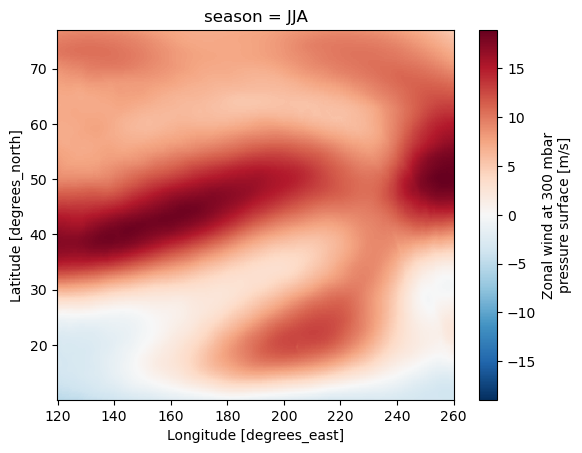

In [64]:
# what do negative values mean? direction?
# I think positive = westerlies (west to east), negative = easterlies (east to west)
U300_hist_smean.sel(season='JJA').plot();

In [65]:
U300_hist_smean.min().values

array(-7.8949027, dtype=float32)

In [66]:
U300_hist_smean.max().values

array(66.60052, dtype=float32)

In [67]:
U300_rcp_smean.min().values

array(-7.228951, dtype=float32)

In [68]:
U300_rcp_smean.max().values

array(57.827366, dtype=float32)

### Calculate seasonal difference

In [69]:
U300_diff_smean_weighted = U300_rcp_smean_weighted - U300_hist_smean_weighted
U300_diff_smean_weighted = U300_diff_smean_weighted.persist()

In [70]:
U300_diff_smean_weighted.min().values

array(-12.36948994)

In [71]:
U300_diff_smean_weighted.max().values

array(7.47855307)

In [72]:
U300_diff_smean = U300_rcp_smean - U300_hist_smean
U300_diff_smean = U300_diff_smean.persist()

In [73]:
U300_diff_smean.min().values

array(-12.552921, dtype=float32)

In [74]:
U300_diff_smean.max().values

array(7.5385838, dtype=float32)

### Panel plot with seasonal means and differences

Speedup drastically increases with `.persist` of relevant fields and the use of `pcolormesh` instead of `pcolor`

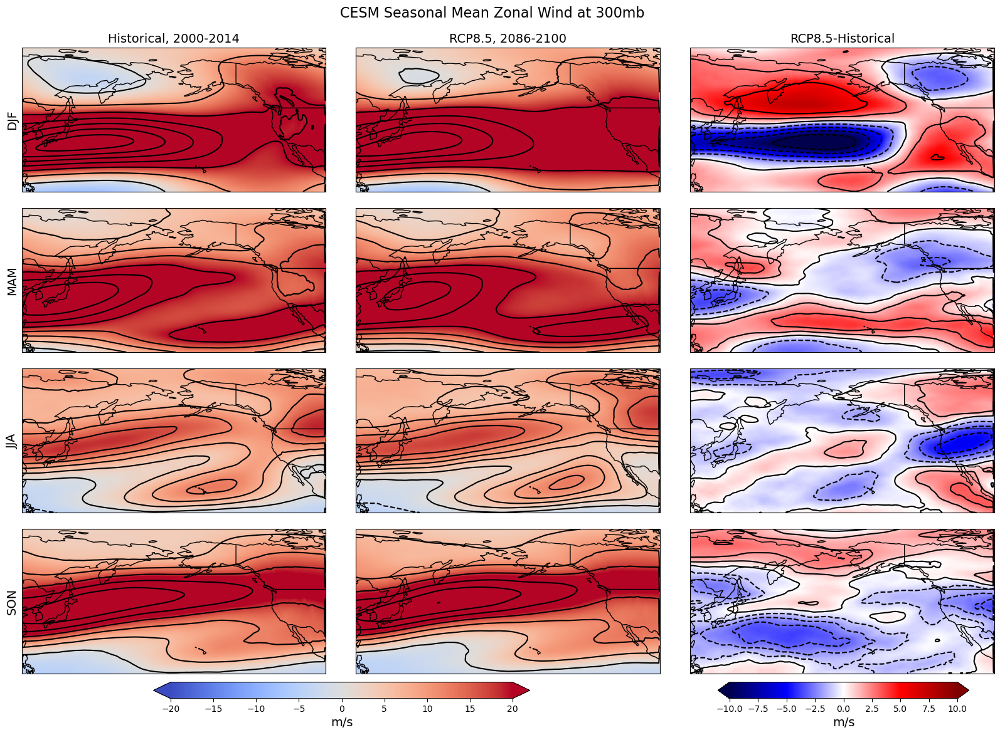

In [77]:
# spatial plots by season type
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})

#cmap = plt.cm.get_cmap('coolwarm')
cmap = mpl.colormaps.get_cmap('coolwarm')
vmin=-20
vmax=20
# discrete colormap
#cmap=plt.cm.get_cmap('Greens', 8)
#vmax=4 # for absolute plots

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,0].set_title('Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(U300_hist_smean_weighted.sel(season=season), coord=U300_hist_smean_weighted.lon)
    lat = U300_hist_smean_weighted.lat
    cf = axs[i,0].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    axs[i,0].set_ylabel(seastrings[i], fontsize=14)
    axs[i,0].set_yticks([])
    #axs[i].set_extent((lon[0],lon[-1],lat[0],lat[-1]), crs=ccrs.PlateCarree())
    
for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(U300_rcp_smean_weighted.sel(season=season), coord=U300_rcp_smean_weighted.lon)
    lat = U300_rcp_smean_weighted.lat
    cf = axs[i,1].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)
    
# colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.08, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('m/s', fontsize=14)

# difference plot
#cmap2 = plt.cm.get_cmap('seismic')
cmap2 = mpl.colormaps.get_cmap('seismic')
vmin2=-10
vmax2=10

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,2].set_title('RCP8.5-Historical', fontsize=14)
    field, lon = add_cyclic_point(U300_diff_smean_weighted.sel(season=season), coord=U300_diff_smean_weighted.lon)
    lat = U300_diff_smean_weighted.lat
    cf = axs[i,2].pcolormesh(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].contour(lon, lat, field, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree(), colors='black')
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('m/s', fontsize=14)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
fig.suptitle('CESM Seasonal Mean Zonal Wind at 300mb', fontsize=16, y=0.93);

#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_U300_smean_weighted_WUS.png', bbox_inches='tight')

### Compare unweighted seasonal means

/glade/derecho/scratch/kdagon/tmp/ipykernel_12784/3927708506.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')
/glade/derecho/scratch/kdagon/tmp/ipykernel_12784/3927708506.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = plt.cm.get_cmap('seismic')


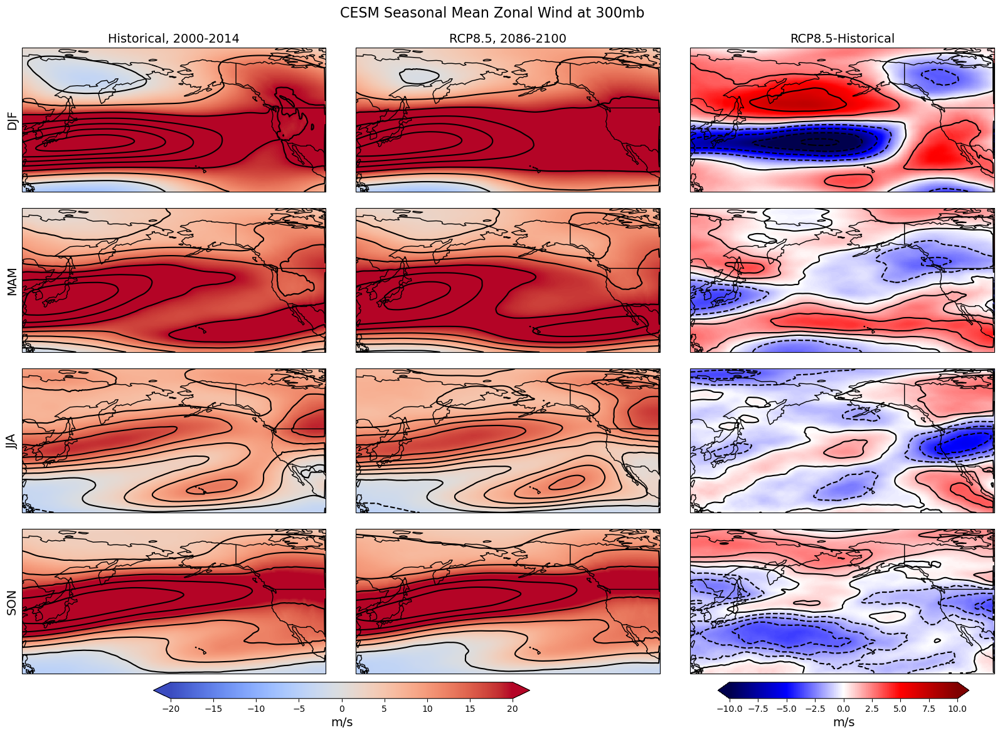

In [68]:
# spatial plots by season type
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})

cmap = plt.cm.get_cmap('coolwarm')
vmin=-20
vmax=20

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,0].set_title('Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(U300_hist_smean.sel(season=season), coord=U300_hist_smean.lon)
    lat = U300_hist_smean.lat
    cf = axs[i,0].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    #cf = axs[i,0].contourf(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    #axs[i,0].set_extent((lon[0],lon[-1],lat[0],lat[-1]), crs=ccrs.PlateCarree()) # helps prevent white space at edges
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    axs[i,0].set_ylabel(seastrings[i], fontsize=14)
    axs[i,0].set_yticks([])
    
for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(U300_rcp_smean.sel(season=season), coord=U300_rcp_smean.lon)
    lat = U300_rcp_smean.lat
    cf = axs[i,1].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    #cf = axs[i,1].contourf(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)
    
# colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.08, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('m/s', fontsize=14)

# difference plot
cmap2 = plt.cm.get_cmap('seismic')
vmin2=-10
vmax2=10

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,2].set_title('RCP8.5-Historical', fontsize=14)
    field, lon = add_cyclic_point(U300_diff_smean.sel(season=season), coord=U300_diff_smean.lon)
    lat = U300_diff_smean.lat
    cf = axs[i,2].pcolormesh(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    #cf = axs[i,2].contourf(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].contour(lon, lat, field, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree(), colors='black')
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('m/s', fontsize=14)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
fig.suptitle('CESM Seasonal Mean Zonal Wind at 300mb', fontsize=16, y=0.93);

#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_U300_smean_unweighted.png', bbox_inches='tight')

/glade/derecho/scratch/kdagon/tmp/ipykernel_12784/914834899.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')
/glade/derecho/scratch/kdagon/tmp/ipykernel_12784/914834899.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = plt.cm.get_cmap('seismic')


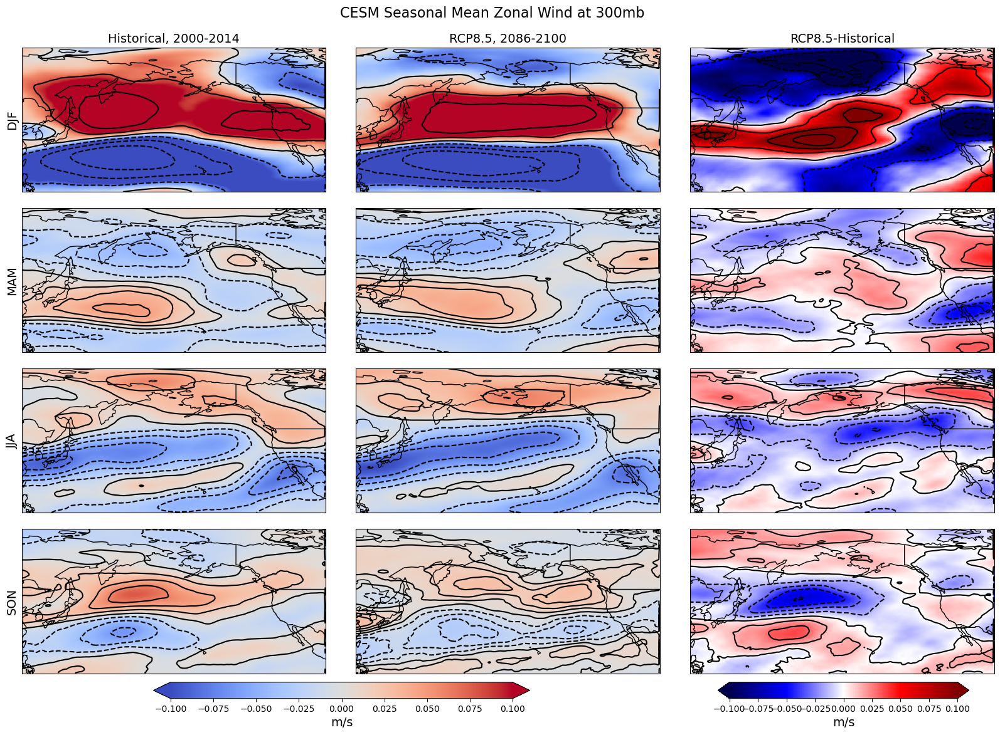

In [70]:
## Diff weighted vs. unweighted
# spatial plots by season type
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})

cmap = plt.cm.get_cmap('coolwarm')
vmin=-0.1
vmax=0.1
# discrete colormap
#cmap=plt.cm.get_cmap('Greens', 8)
#vmax=4 # for absolute plots

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,0].set_title('Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(U300_hist_smean_weighted.sel(season=season) - U300_hist_smean.sel(season=season), coord=U300_hist_smean_weighted.lon)
    lat = U300_hist_smean_weighted.lat
    cf = axs[i,0].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    axs[i,0].set_ylabel(seastrings[i], fontsize=14)
    axs[i,0].set_yticks([])
    #axs[i].set_extent((lon[0],lon[-1],lat[0],lat[-1]), crs=ccrs.PlateCarree())
    
for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(U300_rcp_smean_weighted.sel(season=season) - U300_rcp_smean.sel(season=season), coord=U300_rcp_smean_weighted.lon)
    lat = U300_rcp_smean_weighted.lat
    cf = axs[i,1].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)
    
# colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.08, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('m/s', fontsize=14)

# difference plot
cmap2 = plt.cm.get_cmap('seismic')
vmin2=-0.1
vmax2=0.1

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,2].set_title('RCP8.5-Historical', fontsize=14)
    field, lon = add_cyclic_point(U300_diff_smean_weighted.sel(season=season) - U300_diff_smean.sel(season=season), coord=U300_diff_smean_weighted.lon)
    lat = U300_diff_smean_weighted.lat
    cf = axs[i,2].pcolormesh(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].contour(lon, lat, field, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree(), colors='black')
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('m/s', fontsize=14)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
fig.suptitle('CESM Seasonal Mean Zonal Wind at 300mb', fontsize=16, y=0.93);

#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_U300_smean_weighted_minus_unweighted.png', bbox_inches='tight')

There is more of a significant difference in DJF (due to short Febs?)

## Read in sea level pressure

### Historical

In [7]:
hist_yrs = [str(i) for i in range(2000,2006)]
hist_yrs

['2000', '2001', '2002', '2003', '2004', '2005']

In [8]:
PSL_file = '*.nc'
hist_paths = [cgnet_hist_filepath+y+'/'+PSL_file for y in hist_yrs]
hist_paths

['/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/2000/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/2001/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/2002/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/2003/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/2004/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/B20TRC5CN/2005/*.nc']

### Preprocessing function

In [10]:
def preprocess_PSL(ds):
    # return regional domain
    return ds['PSL'].sel(lat=lat_bounds,lon=lon_bounds)

### Read in files with preprocessing function
`xr.open_mfdataset` won't take a list of paths with wildcards, so have to feed each one and then concat\
there may be a fast way with some sort of list expansion / glob ?

In [25]:
%%time
PSL_hist_list = []
for i,f in enumerate(hist_paths):
    #print(i)    
    PSL_hist_temp = xr.open_mfdataset(hist_paths[i], concat_dim='time', combine="nested", chunks={'time':500}, parallel=True, preprocess=preprocess_PSL)
    PSL_hist_list.append(PSL_hist_temp)
PSL_hist = xr.concat(PSL_hist_list, dim='time')
PSL_hist

CPU times: user 1min 23s, sys: 3.12 s, total: 1min 26s
Wall time: 2min 59s


<xarray.DataArray 'PSL' (time: 17520, lat: 285, lon: 449)>
dask.array<concatenate, shape=(17520, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2000-01-01 03:00:00 ... 2006-01-01 00:00:00
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
Attributes:
    long_name:  Sea level pressure
    units:      Pa

### Shift time indices of 2000-2005 back 3hrs to avoid duplicative index

In [26]:
timeshift = PSL_hist.sel(time=slice("2000-01-01 03:00:00","2006-01-01 00:00:00")).time.indexes['time'].shift(-3,"h")

In [27]:
timeshift

CFTimeIndex([2000-01-01 00:00:00, 2000-01-01 03:00:00, 2000-01-01 06:00:00,
             2000-01-01 09:00:00, 2000-01-01 12:00:00, 2000-01-01 15:00:00,
             2000-01-01 18:00:00, 2000-01-01 21:00:00, 2000-01-02 00:00:00,
             2000-01-02 03:00:00,
             ...
             2005-12-30 18:00:00, 2005-12-30 21:00:00, 2005-12-31 00:00:00,
             2005-12-31 03:00:00, 2005-12-31 06:00:00, 2005-12-31 09:00:00,
             2005-12-31 12:00:00, 2005-12-31 15:00:00, 2005-12-31 18:00:00,
             2005-12-31 21:00:00],
            dtype='object', length=17520, calendar='noleap', freq='3h')

In [28]:
PSL_hist_final = PSL_hist.sel(time=slice("2000-01-01 03:00:00","2006-01-01 00:00:00")).assign_coords(time=timeshift)
PSL_hist_final

<xarray.DataArray 'PSL' (time: 17520, lat: 285, lon: 449)>
dask.array<concatenate, shape=(17520, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * time     (time) object 2000-01-01 00:00:00 ... 2005-12-31 21:00:00
Attributes:
    long_name:  Sea level pressure
    units:      Pa

### RCP2.6

In [29]:
rcp26_yrs = [str(i) for i in range(2006,2016)]
rcp26_yrs

['2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015']

In [30]:
PSL_file = '*.nc'
rcp26_paths = [cgnet_rcp26_filepath+y+'/'+PSL_file for y in rcp26_yrs]
rcp26_paths

['/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2006/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2007/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2008/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2009/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2010/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2011/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2012/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2013/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2014/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP26C5CN/2015/*.nc']

In [31]:
%%time
PSL_rcp26_list = []
for i,f in enumerate(rcp26_paths):
    #print(i)    
    PSL_rcp26_temp = xr.open_mfdataset(rcp26_paths[i], concat_dim='time', combine="nested", chunks={'time':500}, parallel=True, preprocess=preprocess_PSL)
    PSL_rcp26_list.append(PSL_rcp26_temp)
PSL_rcp26 = xr.concat(PSL_rcp26_list, dim='time')
PSL_rcp26

CPU times: user 2min 22s, sys: 5.48 s, total: 2min 28s
Wall time: 5min 15s


<xarray.DataArray 'PSL' (time: 29200, lat: 285, lon: 449)>
dask.array<concatenate, shape=(29200, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2006-01-01 00:00:00 ... 2015-12-31 21:00:00
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
Attributes:
    long_name:  Sea level pressure
    units:      Pa

### Combine historical/rcp2.6

In [32]:
PSL_present = xr.concat([PSL_hist_final, PSL_rcp26], dim='time')
PSL_present

<xarray.DataArray 'PSL' (time: 46720, lat: 285, lon: 449)>
dask.array<concatenate, shape=(46720, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * time     (time) object 2000-01-01 00:00:00 ... 2015-12-31 21:00:00
Attributes:
    long_name:  Sea level pressure
    units:      Pa

### Subset historical to match number of RCP8.5 years (14)
Or, next time don't both with year 2015 input files!

In [33]:
PSL_present = PSL_present.sel(time=slice("2000-01", "2014-12")) # this works now with updated xarray
#PSL_present = PSL_present[:43800] 
PSL_present

<xarray.DataArray 'PSL' (time: 43800, lat: 285, lon: 449)>
dask.array<getitem, shape=(43800, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * time     (time) object 2000-01-01 00:00:00 ... 2014-12-31 21:00:00
Attributes:
    long_name:  Sea level pressure
    units:      Pa

### RCP8.5

In [34]:
rcp85_yrs = [str(i) for i in range(2086,2101)]
rcp85_yrs

['2086',
 '2087',
 '2088',
 '2089',
 '2090',
 '2091',
 '2092',
 '2093',
 '2094',
 '2095',
 '2096',
 '2097',
 '2098',
 '2099',
 '2100']

In [35]:
PSL_file = '*.nc'
rcp85_paths = [cgnet_rcp85_filepath+y+'/'+PSL_file for y in rcp85_yrs]
rcp85_paths

['/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2086/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2087/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2088/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2089/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2090/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2091/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2092/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2093/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2094/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2095/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2096/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2097/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2098/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2099/*.nc',
 '/glade/campaign/cgd/ccr/kdagon/cgnet/BRCP85C5CN/2100/*.nc']

In [36]:
%%time
PSL_rcp85_list = []
for i,f in enumerate(rcp85_paths):
    #print(i)    
    PSL_rcp85_temp = xr.open_mfdataset(rcp85_paths[i], concat_dim='time', combine="nested", chunks={'time':500}, parallel=True, preprocess=preprocess_PSL)
    PSL_rcp85_list.append(PSL_rcp85_temp)
PSL_rcp85 = xr.concat(PSL_rcp85_list, dim='time')
PSL_rcp85

CPU times: user 3min 38s, sys: 8.31 s, total: 3min 47s
Wall time: 8min 1s


<xarray.DataArray 'PSL' (time: 43800, lat: 285, lon: 449)>
dask.array<concatenate, shape=(43800, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2086-01-01 00:00:00 ... 2100-12-31 21:00:00
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
Attributes:
    long_name:  Sea level pressure
    units:      Pa

### Calculate seasonal means and (optionally) persist for plotting
Note this takes a long time due to complicated task graphs

In [37]:
PSL_present_smean = PSL_present.groupby("time.season").mean(dim='time').persist()
PSL_rcp85_smean = PSL_rcp85.groupby("time.season").mean(dim='time').persist()

/glade/work/kdagon/conda-envs/PEx_v2/lib/python3.11/site-packages/distributed/client.py:3162: UserWarning: Sending large graph of size 56.78 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/glade/work/kdagon/conda-envs/PEx_v2/lib/python3.11/site-packages/distributed/client.py:3162: UserWarning: Sending large graph of size 54.36 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


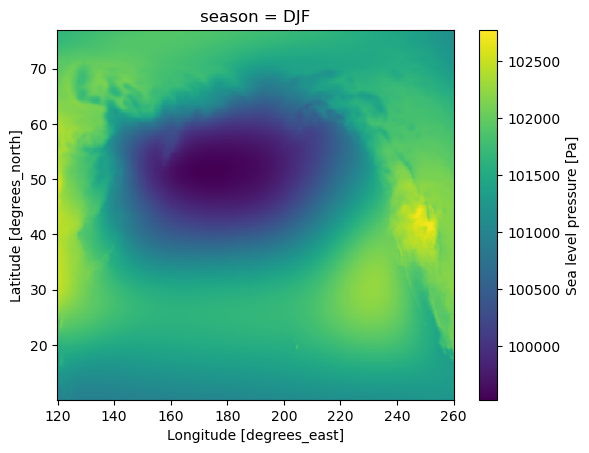

In [38]:
# test plot - units are Pa
PSL_present_smean.sel(season='DJF').plot();

In [39]:
PSL_present_smean.min().values*.01 # convert Pa to hPa

995.307734375

In [40]:
PSL_present_smean.max().values*.01

1028.70234375

In [41]:
PSL_rcp85_smean.min().values*.01

995.286171875

In [42]:
PSL_rcp85_smean.max().values*.01

1026.71234375

### Calculate seasonal difference

In [43]:
PSL_diff_smean = PSL_rcp85_smean - PSL_present_smean
PSL_diff_smean = PSL_diff_smean.persist()

In [44]:
PSL_diff_smean.min().values*.01

-10.690625

In [45]:
PSL_diff_smean.max().values*.01

5.9725

### Panel plot with seasonal means and differences
Note this takes a long time due to complicated task graphs / lack of notebook memory?

/glade/derecho/scratch/kdagon/tmp/ipykernel_30604/334496035.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')
/glade/derecho/scratch/kdagon/tmp/ipykernel_30604/334496035.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = plt.cm.get_cmap('seismic')


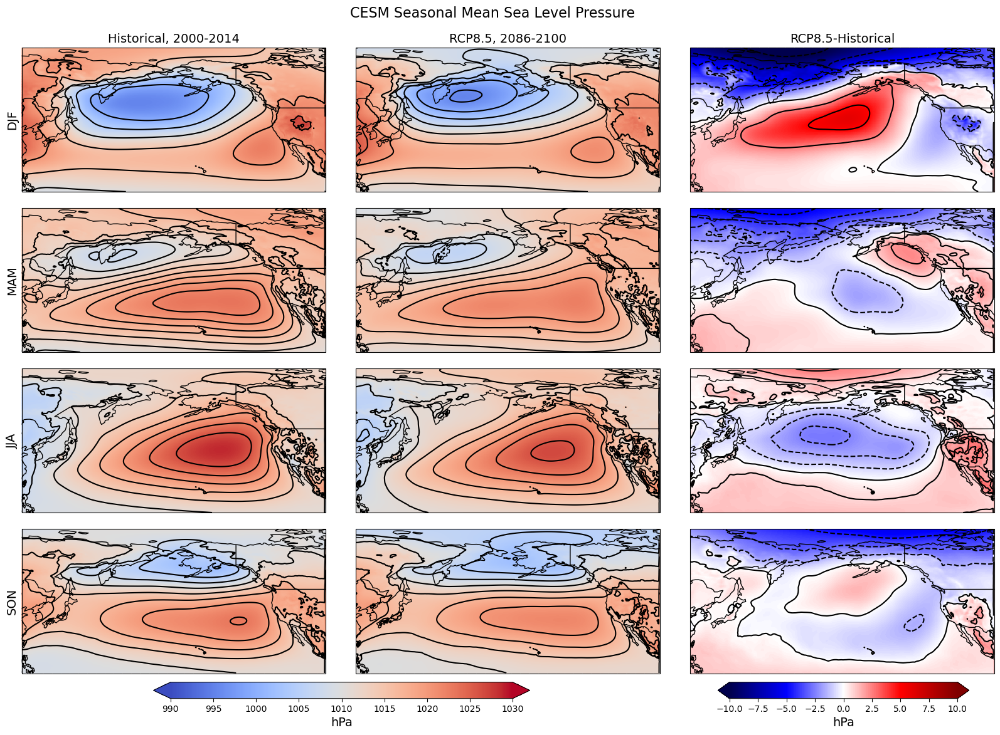

In [47]:
# spatial plots by season type
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})

#cmap = plt.cm.get_cmap('coolwarm')
cmap = mpl.colormaps.get_cmap('coolwarm')
vmin=990
vmax=1030

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,0].set_title('Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(PSL_present_smean.sel(season=season)*0.01, coord=PSL_present_smean.lon)
    lat = PSL_present_smean.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    #cf = axs[i,0].contourf(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    axs[i,0].set_ylabel(seastrings[i], fontsize=14)
    axs[i,0].set_yticks([])
    
for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(PSL_rcp85_smean.sel(season=season)*0.01, coord=PSL_rcp85_smean.lon)
    lat = PSL_rcp85_smean.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    #cf = axs[i,1].contourf(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)
    
# colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.08, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('hPa', fontsize=14)

# difference plot
#cmap2 = plt.cm.get_cmap('seismic')
cmap2 = mpl.colormaps.get_cmap('seismic')
vmin2=-10
vmax2=10

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,2].set_title('RCP8.5-Historical', fontsize=14)
    field, lon = add_cyclic_point(PSL_diff_smean.sel(season=season)*0.01, coord=PSL_diff_smean.lon)
    lat = PSL_diff_smean.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    #cf = axs[i,2].contourf(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].contour(lon, lat, field, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree(), colors='black')
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('hPa', fontsize=14)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
fig.suptitle('CESM Seasonal Mean Sea Level Pressure', fontsize=16, y=0.93);

#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_PSL_smean_WUS.png', bbox_inches='tight')

## Read in geopotential height

In [78]:
# h0.Z300 is monthly mean 300mb geopotential height
# remapped from unstructured grid to FV

Z300_B20TRC5CN_file = "b.e13.B20TRC5CN.ne120_g16.003.cam.h0.Z300.200001-200512.regrid_0.23x0.31.nc"
Z300_BRCP26C5CN_file = "b.e13.BRCP26C5CN.ne120_g16.003.cam.h0.Z300.200601-201512.regrid_0.23x0.31.nc"
Z300_BRCP85C5CN_file = "b.e13.BRCP85C5CN.ne120_g16.003.cam.h0.Z300.208601-210012.regrid_0.23x0.31.nc"

In [79]:
Z300_hist_files = [cesm_hist_filepath+Z300_B20TRC5CN_file, cesm_rcp26_filepath+Z300_BRCP26C5CN_file] # combined hist/rcp26; need explicit filenames (not glob strings) if using a list
Z300_rcp_file = cesm_rcp85_filepath+Z300_BRCP85C5CN_file

In [80]:
Z300_hist_files

['/glade/campaign/cgd/ccr/kdagon/dlfront/B20TRC5CN/b.e13.B20TRC5CN.ne120_g16.003.cam.h0.Z300.200001-200512.regrid_0.23x0.31.nc',
 '/glade/campaign/cgd/ccr/kdagon/dlfront/BRCP26C5CN/b.e13.BRCP26C5CN.ne120_g16.003.cam.h0.Z300.200601-201512.regrid_0.23x0.31.nc']

### Preprocessing function for geopotential height

In [91]:
def preprocess_Z300(ds):
    import cf_xarray # need to import within preprocessing function to access .cf attribute
    # fix CESM time bounds for monthly output
    attrs, encoding = ds.time.attrs.copy(), ds.time.encoding.copy()
    time_bounds = ds.cf.get_bounds('time')
    time_bounds_dim_name = ds.cf.get_bounds_dim_name('time')
    ds = ds.assign_coords(time=time_bounds.mean(time_bounds_dim_name))
    ds.time.attrs, ds.time.encoding = attrs, encoding
    # return global domain
    return ds['Z300']
    # return regional domain
    #return ds['Z300'].sel(lat=lat_bounds,lon=lon_bounds)

### Read in Z300 files
With or without preprocessing function

In [92]:
%%time
Z300_hist = xr.open_mfdataset(Z300_hist_files, concat_dim='time', combine="nested", parallel=True, preprocess=preprocess_Z300) # unclear if chunking is needed for these monthly (smaller) files
#Z300_hist_ds = xr.open_mfdataset(Z300_hist_files, concat_dim='time', combine="nested", chunks={'time':150}, parallel=True)

CPU times: user 178 ms, sys: 4.51 ms, total: 182 ms
Wall time: 1 s


In [93]:
Z300_hist

<xarray.DataArray 'Z300' (time: 192, lat: 768, lon: 1152)>
dask.array<concatenate, shape=(192, 768, 1152), dtype=float32, chunksize=(120, 768, 1152), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * time     (time) object 2000-01-16 12:00:00 ... 2015-12-16 12:00:00
Attributes:
    long_name:      Geopotential height at 300 mbar pressure surface
    unita:          m
    plevo:          300.0
    cell_measures:  area: area

### Subset historical to match number of RCP8.5 years (14)

In [94]:
Z300_hist = Z300_hist.sel(time=slice("2000-01", "2014-12"))
#Z300_hist = Z300_hist[:180] 
Z300_hist

<xarray.DataArray 'Z300' (time: 180, lat: 768, lon: 1152)>
dask.array<getitem, shape=(180, 768, 1152), dtype=float32, chunksize=(108, 768, 1152), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * time     (time) object 2000-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    long_name:      Geopotential height at 300 mbar pressure surface
    unita:          m
    plevo:          300.0
    cell_measures:  area: area

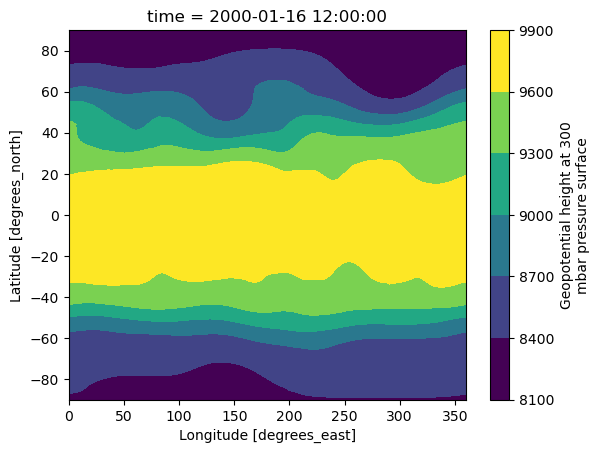

In [95]:
Z300_hist.isel(time=0).plot.contourf();

In [96]:
Z300_rcp_ds = xr.open_dataset(Z300_rcp_file)
# because it's only one file, have to use open_dataset and do the preprocessing manually
attrs, encoding = Z300_rcp_ds.time.attrs.copy(), Z300_rcp_ds.time.encoding.copy()
time_bounds = Z300_rcp_ds.cf.get_bounds('time').load() # need to load time_bounds because .mean won't operate on a dask array
time_bounds_dim_name = Z300_rcp_ds.cf.get_bounds_dim_name('time')
Z300_rcp_ds = Z300_rcp_ds.assign_coords(time=time_bounds.mean(time_bounds_dim_name))
Z300_rcp_ds.time.attrs, Z300_rcp_ds.time.encoding = attrs, encoding
# global domain
Z300_rcp = Z300_rcp_ds['Z300']
# regional domain
#Z300_rcp = Z300_rcp_ds['Z300'].sel(lat=lat_bounds,lon=lon_bounds)
Z300_rcp

<xarray.DataArray 'Z300' (time: 180, lat: 768, lon: 1152)>
[159252480 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * time     (time) object 2086-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    long_name:      Geopotential height at 300 mbar pressure surface
    unita:          m
    plevo:          300.0
    cell_measures:  area: area

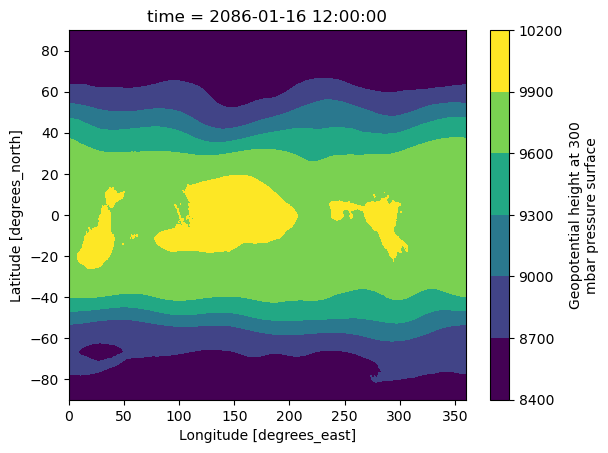

In [97]:
Z300_rcp.isel(time=0).plot.contourf();

### Weighted global mean function
From ADF: https://github.com/NCAR/ADF/blob/main/scripts/analysis/amwg_table.py

In [98]:
def spatial_average(indata):
    import xarray as xr
    import numpy as np
    assert 'lev' not in indata.coords
    assert 'ilev' not in indata.coords
    if 'lat' in indata.coords:
        weights = np.cos(np.deg2rad(indata.lat))
        weights.name = "weights"
    elif 'ncol' in indata.coords:
        print("WARNING: We need a way to get area variable. Using equal weights.")
        weights = xr.DataArray(1.)
        weights.name = "weights"
    else:
        weights = xr.DataArray(1.)
        weights.name = "weights"
    weighted = indata.weighted(weights)
    # we want to average over all non-time dimensions
    avgdims = [dim for dim in indata.dims if dim != 'time']
    return weighted.mean(dim=avgdims)

### Calculate the global mean with time for each simulation period

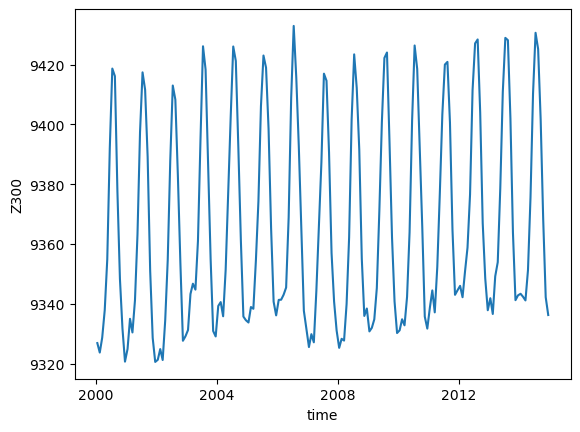

In [99]:
Z300_hist_gm = spatial_average(Z300_hist)
Z300_hist_gm.plot();

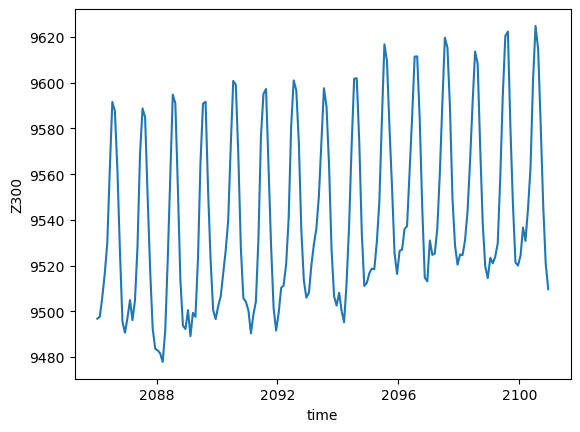

In [100]:
Z300_rcp_gm = spatial_average(Z300_rcp)
Z300_rcp_gm.plot();

In [101]:
# seasonal mean
Z300_hist_gm_smean = Z300_hist_gm.groupby("time.season").mean(dim='time')
Z300_hist_gm_smean

<xarray.DataArray 'Z300' (season: 4)>
dask.array<stack, shape=(4,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [102]:
Z300_rcp_gm_smean = Z300_rcp_gm.groupby("time.season").mean(dim='time')
Z300_rcp_gm_smean

<xarray.DataArray 'Z300' (season: 4)>
array([9508.2424406 , 9594.83055806, 9526.34495481, 9538.15016337])
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [103]:
# seasonal mean differences
Z300_gm_smean_diff = Z300_rcp_gm_smean - Z300_hist_gm_smean
Z300_gm_smean_diff.values

array([174.11463943, 180.33970095, 175.94476699, 174.562882  ])

In [104]:
# how do the regional mean values compare?
Z300_hist_rm_smean = spatial_average(Z300_hist.sel(lat=lat_bounds,lon=lon_bounds)).groupby("time.season").mean(dim='time')
Z300_rcp_rm_smean = spatial_average(Z300_rcp.sel(lat=lat_bounds,lon=lon_bounds)).groupby("time.season").mean(dim='time')
Z300_rm_smean_diff = Z300_rcp_rm_smean - Z300_hist_rm_smean
Z300_rm_smean_diff.values
# DJF and MAM (3rd index!) are somewhat similar, but JJA and SON have larger regional mean changes so the plots do change in terms of the lesser features

array([180.77433749, 193.30580461, 177.79996104, 193.45202187])

### Calculate seasonal means over space and (optionally) persist for plotting
Subset North American domain if not already done

In [105]:
#Z300_hist_smean = Z300_hist.groupby("time.season").mean(dim='time').persist()
#Z300_rcp_smean = Z300_rcp.groupby("time.season").mean(dim='time').persist()
Z300_hist_smean = Z300_hist.sel(lat=lat_bounds,lon=lon_bounds).groupby("time.season").mean(dim='time').persist()
Z300_rcp_smean = Z300_rcp.sel(lat=lat_bounds,lon=lon_bounds).groupby("time.season").mean(dim='time').persist()

In [106]:
Z300_hist_smean

<xarray.DataArray 'Z300' (season: 4, lat: 285, lon: 449)>
dask.array<stack, shape=(4, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    long_name:      Geopotential height at 300 mbar pressure surface
    unita:          m
    plevo:          300.0
    cell_measures:  area: area

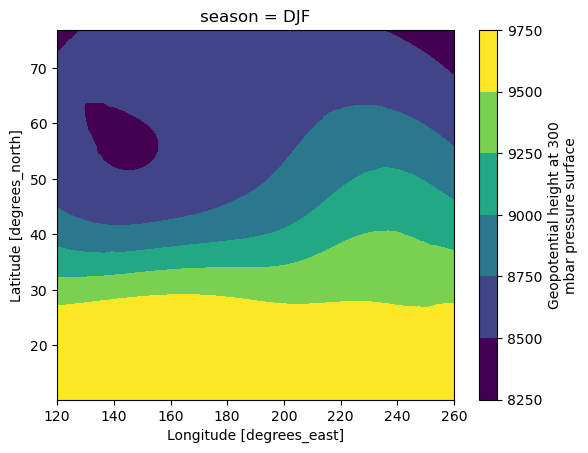

In [107]:
# test plot - units are m
Z300_hist_smean.sel(season='DJF').plot.contourf();

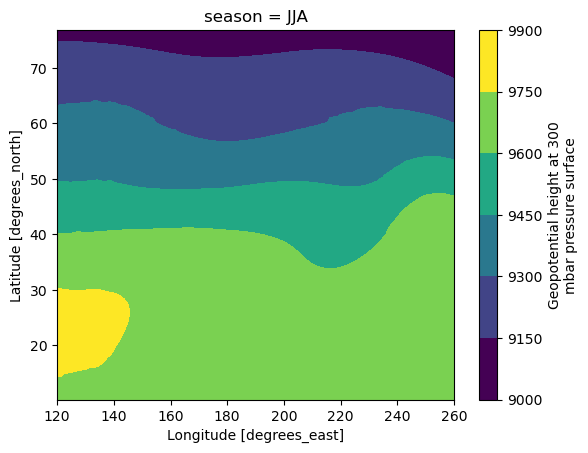

In [108]:
Z300_hist_smean.sel(season='JJA').plot.contourf();

In [109]:
Z300_hist_smean.min().values

array(8432.049, dtype=float32)

In [110]:
Z300_hist_smean.max().values

array(9770.884, dtype=float32)

In [111]:
Z300_rcp_smean.min().values

array(8568.35351562)

In [112]:
Z300_rcp_smean.max().values

array(9950.73046875)

### Calculate seasonal difference

In [113]:
Z300_diff_smean = Z300_rcp_smean - Z300_hist_smean
#Z300_diff_smean = Z300_diff_smean.persist()
Z300_diff_smean

<xarray.DataArray 'Z300' (season: 4, lat: 285, lon: 449)>
dask.array<subtract, shape=(4, 285, 449), dtype=float32, chunksize=(1, 285, 449), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 10.21 10.44 10.68 10.91 ... 76.15 76.39 76.62 76.86
  * lon      (lon) float64 120.0 120.3 120.6 120.9 ... 259.1 259.4 259.7 260.0
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

### Subtract the global mean seasonal mean differences from each gridpoint
Persist for plotting

In [114]:
Z300_diff_smean_minusgm = Z300_diff_smean - Z300_gm_smean_diff
Z300_diff_smean_minusgm = Z300_diff_smean_minusgm.persist()

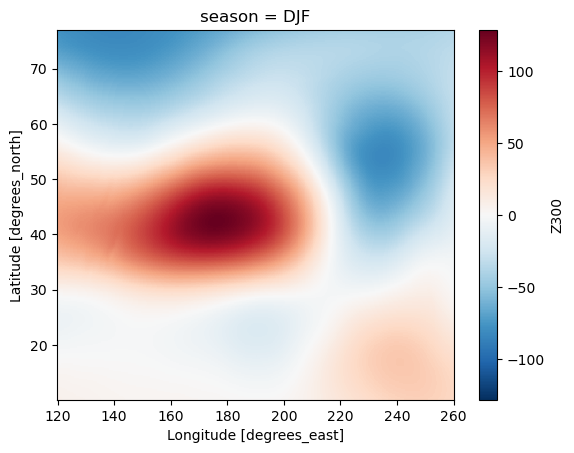

In [115]:
Z300_diff_smean_minusgm.sel(season='DJF').plot();

In [116]:
#Z300_diff_smean.min().values
Z300_diff_smean_minusgm.min().values

array(-83.2845613)

In [117]:
#Z300_diff_smean.max().values
Z300_diff_smean_minusgm.max().values

array(128.44102463)

### Test subtracting the regional mean differences

In [118]:
Z300_diff_smean_minusrm = Z300_diff_smean - Z300_rm_smean_diff
Z300_diff_smean_minusrm = Z300_diff_smean_minusrm.persist()

### Panel plot with seasonal means and differences

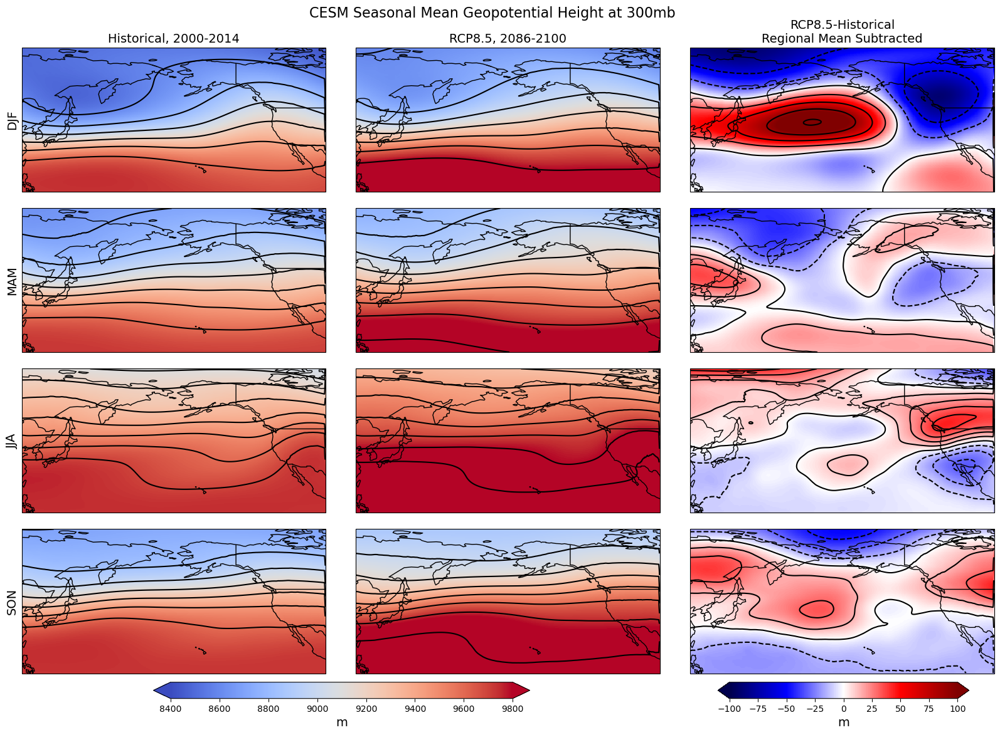

In [120]:
# spatial plots by season type
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})

#cmap = plt.cm.get_cmap('coolwarm', 14)
#cmap = plt.cm.get_cmap('coolwarm')
cmap = mpl.colormaps.get_cmap('coolwarm')
vmin=8400
vmax=9800

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,0].set_title('Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(Z300_hist_smean.sel(season=season), coord=Z300_hist_smean.lon)
    lat = Z300_hist_smean.lat
    axs[i,0].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black') # this needs to be first otherwise spatial domain gets cut off
    #cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree()) # pcolor takes longer
    cf = axs[i,0].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree()) # leaves a white outline
    #cf = axs[i,0].contourf(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    #print(seastrings[i])
    axs[i,0].set_ylabel(seastrings[i], fontsize=14)
    axs[i,0].set_yticks([])
    
for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(Z300_rcp_smean.sel(season=season), coord=Z300_rcp_smean.lon)
    lat = Z300_rcp_smean.lat
    axs[i,1].contour(lon, lat, field, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), colors='black')
    #cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    cf = axs[i,1].pcolormesh(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    #cf = axs[i,1].contourf(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)
    
# colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.08, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('m', fontsize=14)

# difference plot
#cmap2 = plt.cm.get_cmap('seismic', 12)
#cmap2 = plt.cm.get_cmap('seismic')
cmap2 = mpl.colormaps.get_cmap('seismic')

# absolute differences
#vmin2=-300
#vmax2=300
# "normalized" differences
vmin2=-100
vmax2=100

for i, season in enumerate(seastrings):
    if i==0:
        #axs[i,2].set_title('RCP8.5-Historical', fontsize=14)
        #axs[i,2].set_title('RCP8.5-Historical\nGlobal Mean Subtracted', fontsize=14)
        axs[i,2].set_title('RCP8.5-Historical\nRegional Mean Subtracted', fontsize=14)
    #field, lon = add_cyclic_point(Z300_diff_smean.sel(season=season), coord=Z300_diff_smean.lon)
    #lat = Z300_diff_smean.lat
    # Global Mean subtracted
    #field, lon = add_cyclic_point(Z300_diff_smean_minusgm.sel(season=season), coord=Z300_diff_smean_minusgm.lon)
    #lat = Z300_diff_smean_minusgm.lat
    # Regional Mean subtracted
    field, lon = add_cyclic_point(Z300_diff_smean_minusrm.sel(season=season), coord=Z300_diff_smean_minusrm.lon)
    lat = Z300_diff_smean_minusrm.lat
    axs[i,2].contour(lon, lat, field, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree(), colors='black')
    #cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    cf = axs[i,2].pcolormesh(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    #cf = axs[i,2].contourf(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('m', fontsize=14)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
fig.suptitle('CESM Seasonal Mean Geopotential Height at 300mb', fontsize=16, y=0.93);

#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_Z300_smean_minusgm_WUS.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_Z300_smean_minusrm_WUS.png', bbox_inches='tight')

## Panel the differences only: U300, Z300, SLP

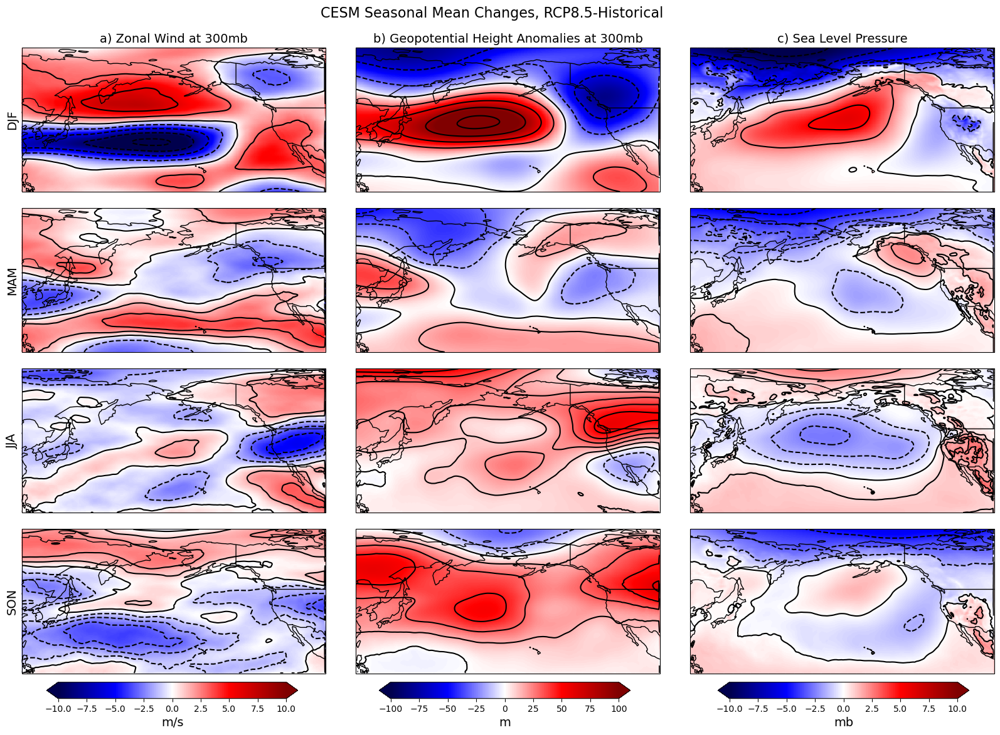

In [122]:
# spatial plots by season type
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})

cmap = mpl.colormaps.get_cmap('seismic')

# U300 difference plot
vmin1=-10
vmax1=10

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,0].set_title('a) Zonal Wind at 300mb', fontsize=14)
    field, lon = add_cyclic_point(U300_diff_smean.sel(season=season), coord=U300_diff_smean.lon)
    lat = U300_diff_smean.lat
    axs[i,0].contour(lon, lat, field, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree(), colors='black')
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])

# U300 colorbar
cb1_ax = fig.add_axes([0.145, 0.08, 0.2, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('m/s', fontsize=14)

# Z300 difference plot
# "normalized" differences
vmin2=-100
vmax2=100

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,1].set_title('b) Geopotential Height Anomalies at 300mb', fontsize=14)
    field, lon = add_cyclic_point(Z300_diff_smean_minusgm.sel(season=season), coord=Z300_diff_smean_minusgm.lon)
    lat = Z300_diff_smean_minusgm.lat
    axs[i,1].contour(lon, lat, field, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree(), colors='black')
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)

# Z300 colorbar
cb2_ax = fig.add_axes([0.41, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('m', fontsize=14)

# PSL difference plot
vmin3=-10
vmax3=10

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,2].set_title('c) Sea Level Pressure', fontsize=14)
    field, lon = add_cyclic_point(PSL_diff_smean.sel(season=season)*0.01, coord=PSL_diff_smean.lon)
    lat = PSL_diff_smean.lat
    axs[i,2].contour(lon, lat, field, vmin=vmin3, vmax=vmax3, transform=ccrs.PlateCarree(), colors='black')
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap, vmin=vmin3, vmax=vmax3, transform=ccrs.PlateCarree())
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)

# PSL colorbar
cb3_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm3 = mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cb3 = mpl.colorbar.ColorbarBase(cb3_ax, cmap=cmap, norm=norm3, orientation='horizontal', extend='both')
cb3.ax.set_xlabel('mb', fontsize=14)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
fig.suptitle('CESM Seasonal Mean Changes, RCP8.5-Historical', fontsize=16, y=0.93);

#plt.savefig('../figures/toSCP/cesm_hist_rcp85_diff_U300_Z300_PSL_smean_WUS.png', bbox_inches='tight', dpi=300)

## TO DO
-  Compare to changes in low level jet in western US (U850?)
-  Meridional wind changes? (V300 / V850?)

In [88]:
client.close()
cluster.close()